In [33]:
# ============================================================
# A55 Visium HD 2 µm — clean setup
# ============================================================

import json
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import scanpy as sc


In [34]:

# ============================================================
# 1. LOAD RAW 2 µm VISIUM HD DATA
# ============================================================

bin_path = Path(
    "/storage/riosugimuralab/alexto/01_CtscbBackUp/customer/2024/0923/PN20240716037/"
    "SPL2024081109/SpaceRanger/A55/binned_outputs/square_002um"
)

Assembloid_raw = sc.read_10x_h5(
    bin_path / "filtered_feature_bc_matrix.h5"
)

positions = pd.read_parquet(
    bin_path / "spatial" / "tissue_positions.parquet",
    columns=[
        "barcode",
        "in_tissue",
        "array_row",
        "array_col",
        "pxl_row_in_fullres",
        "pxl_col_in_fullres",
    ],
    filters=[("in_tissue", "==", 1)],
).set_index("barcode")

positions = positions.reindex(Assembloid_raw.obs_names)

if positions[["pxl_row_in_fullres", "pxl_col_in_fullres"]].isna().any().any():
    raise ValueError("Some matrix barcodes are missing spatial coordinates.")

Assembloid_raw.obs = Assembloid_raw.obs.join(
    positions[["in_tissue", "array_row", "array_col"]]
)

Assembloid_raw.obsm["spatial"] = positions[
    ["pxl_col_in_fullres", "pxl_row_in_fullres"]
].to_numpy()

Assembloid_raw.obs["library_id"] = "A55_2um"

with open(bin_path / "spatial" / "scalefactors_json.json") as f:
    scalefactors = json.load(f)

Assembloid_raw.uns["spatial"] = {
    "A55_2um": {
        "images": {},
        "scalefactors": scalefactors
    }
}

print(Assembloid_raw)


/home/alexto22/.conda/envs/spatial-hd/lib/python3.11/site-packages/anndata/_core/anndata.py:1884: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/alexto22/.conda/envs/spatial-hd/lib/python3.11/site-packages/anndata/_core/anndata.py:1884: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 1130079 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'library_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [35]:
# ============================================================
# 2. PREPARE WORKING .copy() OBJECTS
# ============================================================

# Full tissue
CIVA_2um = Assembloid_raw.copy()
xy = CIVA_2um.obsm["spatial"]


# Larger selected tissue region
xmin, xmax = 7000, 9800
ymin, ymax = 6800, 9091

small_mask = (
    (xy[:, 0] >= xmin) & (xy[:, 0] <= xmax) &
    (xy[:, 1] >= ymin) & (xy[:, 1] <= ymax)
)

CIVA_2um_small = CIVA_2um[small_mask].copy()


# Smaller zoomed ROI
xmin, xmax = 8300, 9800
ymin, ymax = 7500, 8200

roi_mask = (
    (xy[:, 0] >= xmin) & (xy[:, 0] <= xmax) &
    (xy[:, 1] >= ymin) & (xy[:, 1] <= ymax)
)

CIVA_2um_roi = CIVA_2um[roi_mask].copy()


# Check
if CIVA_2um_small.n_obs == 0 or CIVA_2um_roi.n_obs == 0:
    raise ValueError("No bins found. Check ROI coordinates.")

print(f"Full tissue: {CIVA_2um.n_obs:,} bins")
print(f"Large ROI:   {CIVA_2um_small.n_obs:,} bins")
print(f"Small ROI:   {CIVA_2um_roi.n_obs:,} bins")

/home/alexto22/.conda/envs/spatial-hd/lib/python3.11/site-packages/anndata/_core/anndata.py:1884: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Full tissue: 1,130,079 bins
Large ROI:   127,496 bins
Small ROI:   50,403 bins


In [36]:
C = {
    "magenta": "magenta",
    "cyan": "cyan",
    "gold": "#fcba03",
    "sage": "#6d9987",
    "red": "red",
    "blue": "blue",
    "green": "green",
    "brown": "brown",
    "grey": "#808080",
    "lightgrey": "#BDBDBD",
    "darkgrey": "#505050",
    "tissue": "#403e3f",
}


In [37]:


def plot_markers(
    adata,
    genes,
    thresholds=0.1,
    color_order=("cyan", "magenta", "gold", "sage"),
    tissue_color="tissue",
    tissue_mode="faint",       # "hide", "faint", "show"
    tissue_alpha=0.03,
    pt_size=1,
    figsize=(10, 10),
):
    genes = [genes] if isinstance(genes, str) else list(genes)
    thresholds = [thresholds] * len(genes) if np.isscalar(thresholds) else list(thresholds)

    if not 1 <= len(genes) <= 4:
        raise ValueError("Use 1-4 genes.")
    if len(thresholds) != len(genes):
        raise ValueError("thresholds must match genes.")
    if len(color_order) < len(genes):
        raise ValueError("Not enough colors.")
    if tissue_mode not in {"hide", "faint", "show"}:
        raise ValueError("tissue_mode must be 'hide', 'faint', or 'show'.")

    # Easy color names OR direct HEX/colors
    get_color = lambda x: C.get(x, x)
    colors = [get_color(c) for c in color_order[:len(genes)]]

    # Find all columns for each gene, including duplicated symbols
    gene_pos = {
        g: np.flatnonzero(adata.var_names == g)
        for g in genes
    }

    missing = [g for g, pos in gene_pos.items() if len(pos) == 0]
    if missing:
        raise KeyError(f"Marker genes not found: {missing}")

    # Sum duplicated gene columns
    expression = {
        g: np.asarray(adata.X[:, pos].sum(axis=1)).ravel()
        for g, pos in gene_pos.items()
    }

    # FIRST gene = highest annotation priority
    conditions = [
        expression[g] > t
        for g, t in zip(genes, thresholds)
    ]

    labels = np.select(
        conditions,
        genes,
        default="tissue"
    )

    xy = adata.obsm["spatial"]

    # ---------------------------------------------------------
    # IMPORTANT:
    # Save FULL spatial extent BEFORE plotting anything.
    # This prevents gene-negative regions from being cropped.
    # ---------------------------------------------------------
    xmin, xmax = xy[:, 0].min(), xy[:, 0].max()
    ymin, ymax = xy[:, 1].min(), xy[:, 1].max()

    fig, ax = plt.subplots(
        figsize=figsize,
        dpi=300,
        facecolor="black"
    )
    ax.set_facecolor("black")

    # Tissue background
    tissue = labels == "tissue"

    if tissue_mode != "hide":
        ax.scatter(
            xy[tissue, 0],
            xy[tissue, 1],
            s=pt_size,
            c=get_color(tissue_color),
            alpha=tissue_alpha if tissue_mode == "faint" else 1,
            linewidths=0,
            rasterized=True,
        )

    # Marker-positive bins
    # Reverse plotting order so the first gene is drawn LAST / on top
    for g, color in reversed(list(zip(genes, colors))):
        mask = labels == g

        ax.scatter(
            xy[mask, 0],
            xy[mask, 1],
            s=pt_size,
            c=color,
            alpha=1,
            linewidths=0,
            rasterized=True,
        )

    # ---------------------------------------------------------
    # FORCE FULL ADATA SPATIAL AREA
    # Do NOT let Matplotlib autoscale based on expressed genes.
    # ---------------------------------------------------------
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymax, ymin)   # reversed directly for spatial orientation

    ax.set_aspect("equal")
    ax.axis("off")

    # Legend
    handles = [
        Line2D(
            [0], [0],
            marker="o",
            linestyle="",
            markerfacecolor=color,
            markeredgecolor="none",
            markersize=7,
            label=g,
        )
        for g, color in zip(genes, colors)
    ]

    legend = ax.legend(
        handles=handles,
        frameon=True,
        facecolor="black",
        edgecolor="white",
    )

    for text in legend.get_texts():
        text.set_color("white")
        text.set_fontweight("bold")

    plt.show()

    return fig, ax

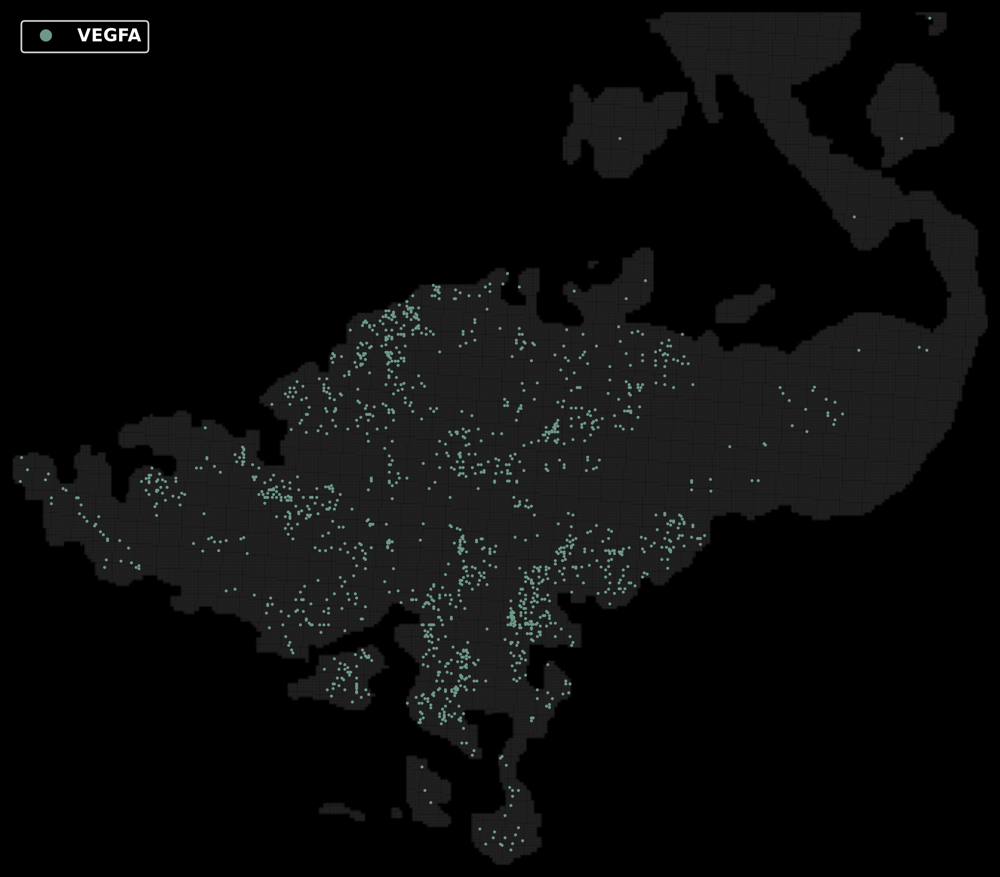

(<Figure size 3000x3000 with 1 Axes>, <Axes: >)

In [38]:

# ============================================================
# EXAMPLES
# ============================================================

# Full tissue

# ROI
plot_markers(
    CIVA_2um_small,
    ["VEGFA"],
    thresholds=[01.7],
    color_order=["sage"],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=3,
)

In [39]:
import scanpy as sc

adata = sc.read_h5ad("01_MS/F4_VisiumHD.h5ad")
# or: adata = sc.read_h5ad("combinedHD_8um_v2.h5ad", backed="r")
mapping = {"Assembloid": "A55", "VIO": "V10"}  # ensure '0' vs 'O' is correct
adata.obs["library_id"] = adata.obs["sample"].astype(str).map(mapping).astype("category")
CIVA_8um = adata[adata.obs['library_id'] == 'A55'].copy()


In [40]:
from scipy.sparse import issparse
import numpy as np
import pandas as pd

genes = ["CD163", "PLVAP", "POSTN", "VEGFA", "COL1A1"]
thresholds = [0.1, 0.1, 0.1, 1.2, 0.5]

labels = [
    "CD163+ Macrophages",
    "PLVAP+ Endothelium",
    "POSTN+ Fibroblast",
    "Cancer cells",
    "Tissue",
]

# Gene symbols stored in CIVA_8um.var["gene_name"]
gene_names = CIVA_8um.var["gene_name"].astype(str).to_numpy()

missing = [g for g in genes if g not in gene_names]
if missing:
    raise KeyError(f"Genes not found: {missing}")

# Extract expression, safely handling duplicate gene symbols
expr = pd.DataFrame(index=CIVA_8um.obs_names)

for g in genes:
    idx = np.where(gene_names == g)[0]
    x = CIVA_8um.X[:, idx]

    if issparse(x):
        x = x.toarray()

    expr[g] = np.asarray(x).max(axis=1).ravel()

# Priority:
# CD163 > PLVAP > POSTN > EPCAM > COL1A1
CIVA_8um.obs["cell_type"] = pd.Categorical(
    np.select(
        [expr[g] > t for g, t in zip(genes, thresholds)],
        labels,
        default="Tissue",
    ),
    categories=labels,
)

CIVA_8um.obs["cell_type"].value_counts()

cell_type
Tissue                36948
Cancer cells          18732
POSTN+ Fibroblast      7647
PLVAP+ Endothelium      297
CD163+ Macrophages      195
Name: count, dtype: int64

In [41]:
import matplotlib.pyplot as plt

# ========= settings =========

adata = CIVA_8um.copy()

target_cells = [
    "CD163+ Macrophages",
    "PLVAP+ Endothelium",
    "POSTN+ Fibroblast",
    "Cancer cells",
    'Tissue'
]

colors = {
    "CD163+ Macrophages": "#0066ff",
    "PLVAP+ Endothelium": "magenta",
    "POSTN+ Fibroblast": "#fcba03",
    "Cancer cells": "#00875A",
    "Tissue": "#bfbfbf",
}

tissue_alpha = 0.15
tissue_size = 1

target_alpha = 1
target_size = 3

figsize = (10, 10)
dpi = 200
save_dpi = 600
plot_background = "black"

xy = adata.obsm["spatial"]

In [42]:
# ============================================================
# PREPARE CIVA 8 um ROI
# ============================================================

CIVA_8um_full = CIVA_8um.copy()
xy = CIVA_8um_full.obsm["spatial"]

# Larger selected tissue region
xmin, xmax = 7000, 9800
ymin, ymax = 6800, 9091

small_mask = (
    (xy[:, 0] >= xmin) & (xy[:, 0] <= xmax) &
    (xy[:, 1] >= ymin) & (xy[:, 1] <= ymax)
)

CIVA_8um_small = CIVA_8um_full[small_mask].copy()

if CIVA_8um_small.n_obs == 0:
    raise ValueError("No spots found in ROI. Check xmin/xmax/ymin/ymax.")

print(f"CIVA 8 um full tissue: {CIVA_8um_full.n_obs:,} spots")
print(f"CIVA 8 um ROI:          {CIVA_8um_small.n_obs:,} spots")

# Smaller zoomed ROI
xmin, xmax = 8300, 9800
ymin, ymax = 7500, 8200

roi_mask = (
    (xy[:, 0] >= xmin) & (xy[:, 0] <= xmax) &
    (xy[:, 1] >= ymin) & (xy[:, 1] <= ymax)
)

CIVA_8um_roi = CIVA_8um_full[roi_mask].copy()

if CIVA_8um_small.n_obs == 0 or CIVA_8um_roi.n_obs == 0:
    raise ValueError("No spots found in ROI. Check xmin/xmax/ymin/ymax.")

print(f"CIVA 8 um full tissue: {CIVA_8um_full.n_obs:,} spots")
print(f"CIVA 8 um large ROI:   {CIVA_8um_small.n_obs:,} spots")
print(f"CIVA 8 um small ROI:   {CIVA_8um_roi.n_obs:,} spots")

CIVA 8 um full tissue: 63,819 spots
CIVA 8 um ROI:          7,162 spots
CIVA 8 um full tissue: 63,819 spots
CIVA 8 um large ROI:   7,162 spots
CIVA 8 um small ROI:   2,719 spots


In [43]:
import matplotlib.pyplot as plt

def plot_spatial(
    adata,
    target_cells,
    colors,
    tissue_size,
    tissue_alpha,
    target_size,
    target_alpha,
    figsize,
    dpi,
    save_dpi,
    plot_background,
    transparent=False,
    save_name="CIVA_spatial.png",
):
    xy = adata.obsm["spatial"]

    fig, ax = plt.subplots(
        figsize=figsize,
        dpi=dpi,
        facecolor="none" if transparent else plot_background,
    )
    ax.set_facecolor("none" if transparent else plot_background)

    # COL1A1+ tissue background
    m = adata.obs["cell_type"] == "Tissue"
    ax.scatter(
        xy[m, 0], xy[m, 1],
        s=tissue_size,
        c=colors["Tissue"],
        alpha=tissue_alpha,
        linewidths=0,
    )

    # Target populations
    for ct in target_cells:
        m = adata.obs["cell_type"] == ct
        ax.scatter(
            xy[m, 0], xy[m, 1],
            s=target_size,
            c=colors[ct],
            alpha=target_alpha,
            linewidths=0,
            label=ct,
        )

    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("off")

    leg = ax.legend(frameon=False, markerscale=3, loc="best")
    for text in leg.get_texts():
        text.set_color("black")

    plt.tight_layout()
    fig.savefig(
        save_name,
        dpi=save_dpi,
        bbox_inches="tight",
        transparent=transparent,
    )
    plt.show()

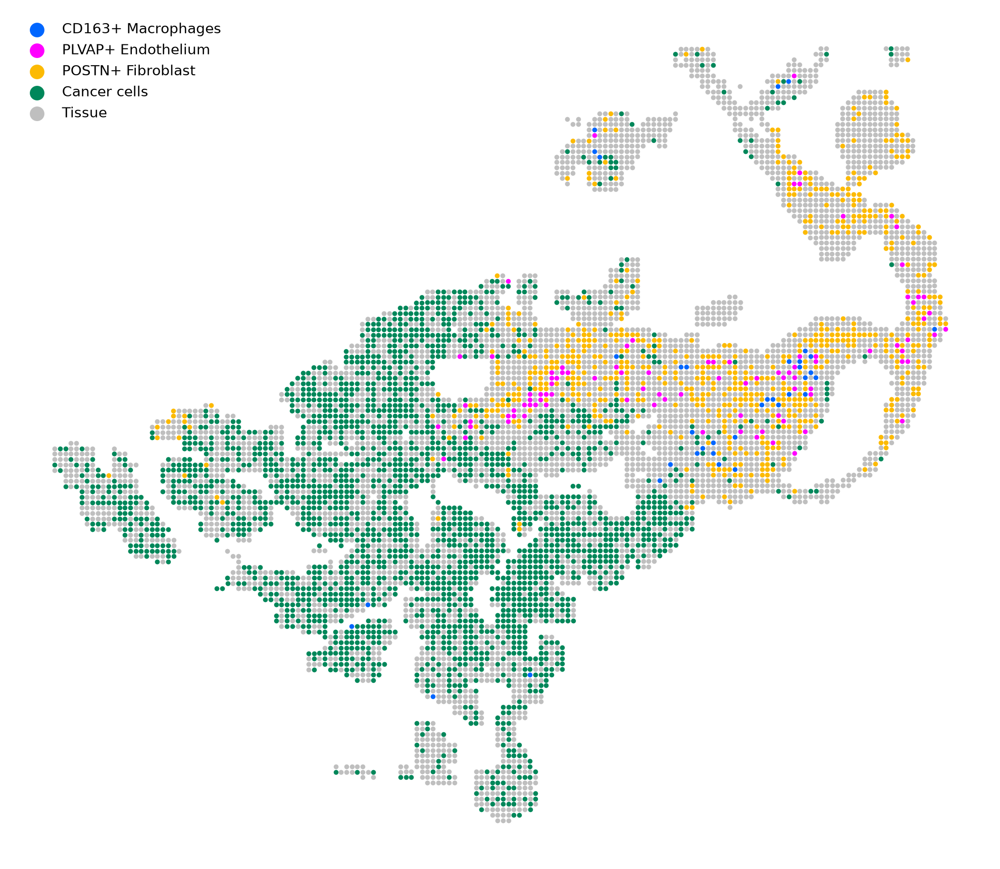

In [44]:
plot_spatial(
    adata=CIVA_8um_small,
    target_cells=target_cells,
    colors=colors,
    tissue_size=3,
    tissue_alpha=0.9,
    target_size=12,
    target_alpha=1,
    figsize=figsize,
    dpi=dpi,
    save_dpi=save_dpi,
    plot_background=plot_background,
    transparent=True,
    save_name="CIVA_ROI.png",
)

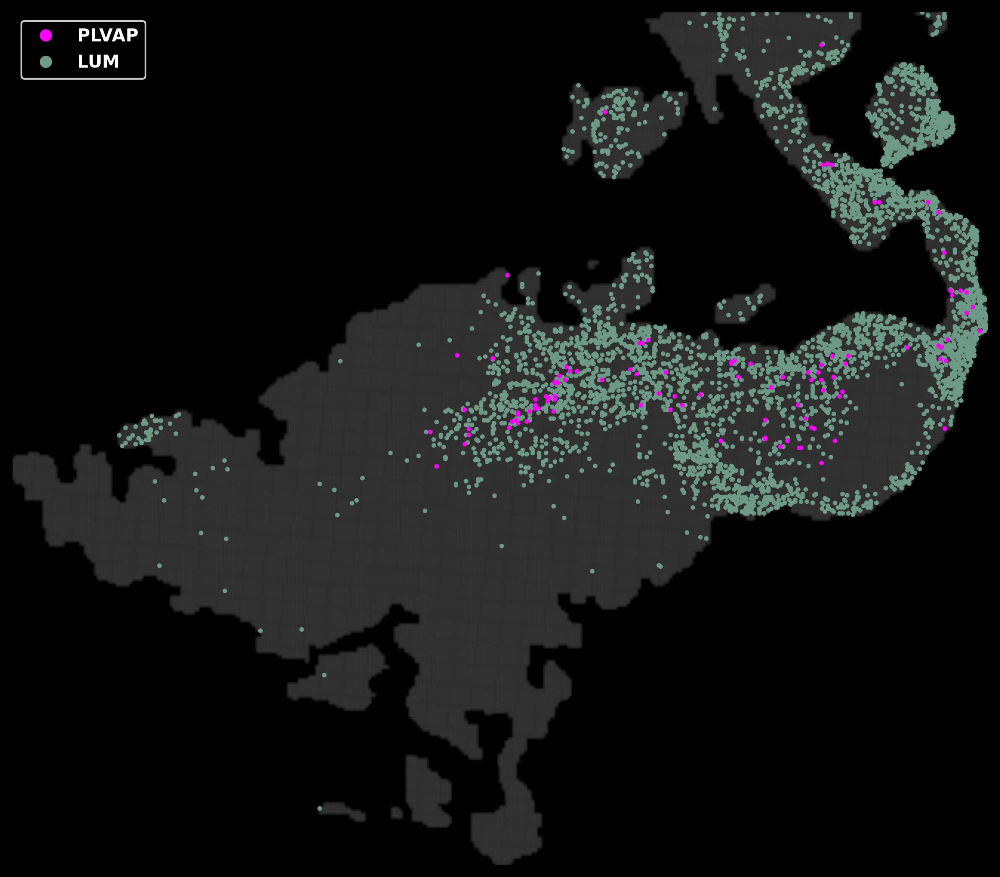

(<Figure size 3000x3000 with 1 Axes>, <Axes: >)

In [45]:
plot_markers(
    CIVA_2um_small,
    ["PLVAP", "LUM"],
    thresholds=[0.1, 0.6],
    color_order=["magenta",  "sage"],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=7,
)

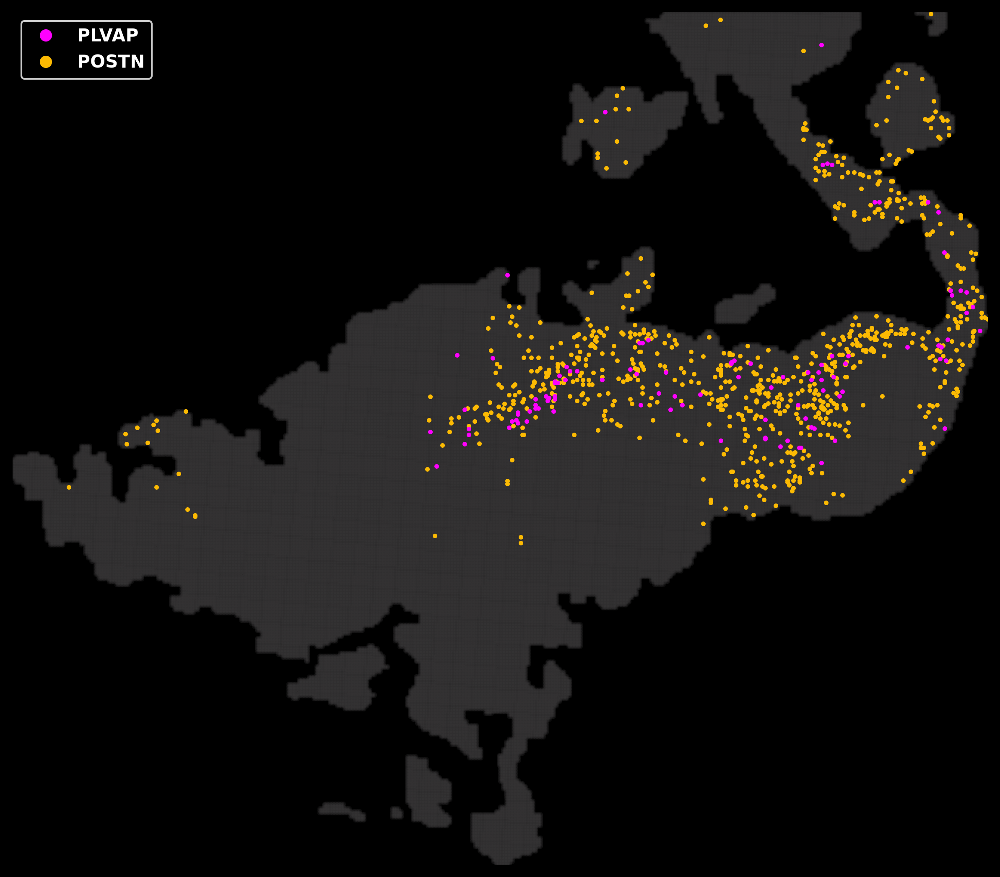

(<Figure size 3000x3000 with 1 Axes>, <Axes: >)

In [46]:
plot_markers(
    CIVA_2um_small,
    ["PLVAP", "POSTN"],
    thresholds=[0.1, 0.8],
    color_order=["magenta", "gold"],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=7,
)

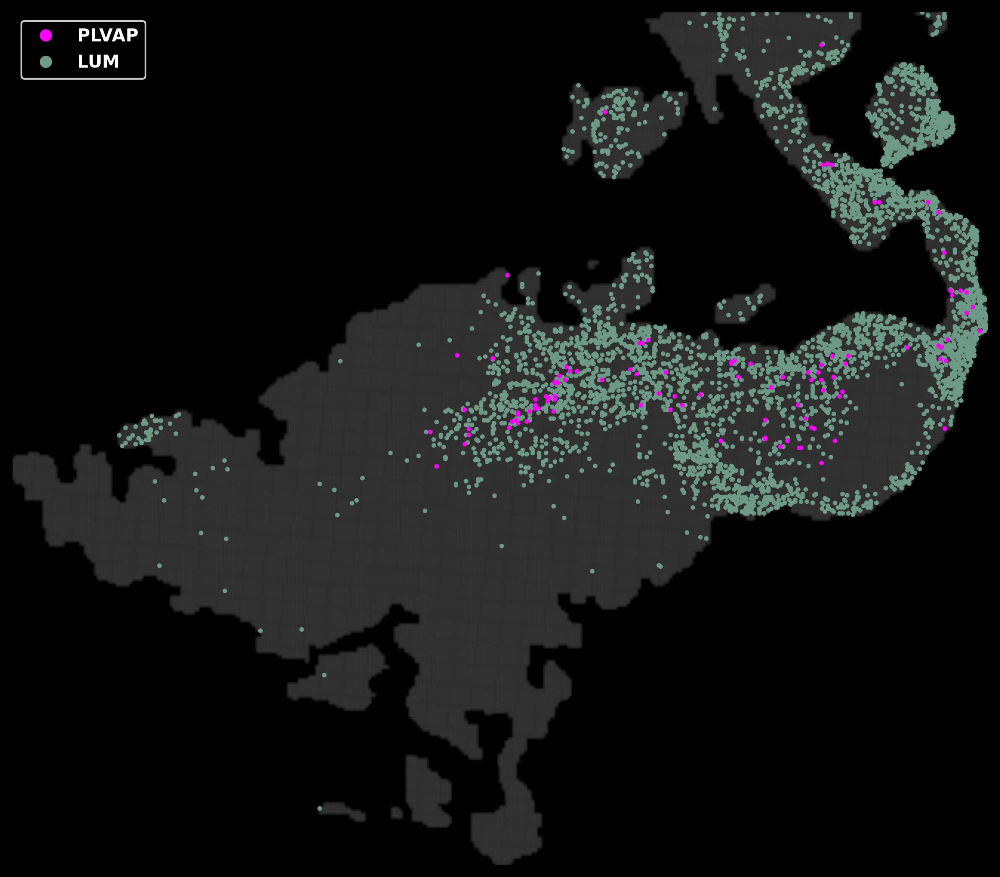

(<Figure size 3000x3000 with 1 Axes>, <Axes: >)

In [62]:
#Plot PLVAP LUM
plot_markers(
    CIVA_2um_small,
    ["PLVAP","LUM"],
    thresholds=[0.1, 0.6],
    color_order=["magenta", "sage"],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=7,
)

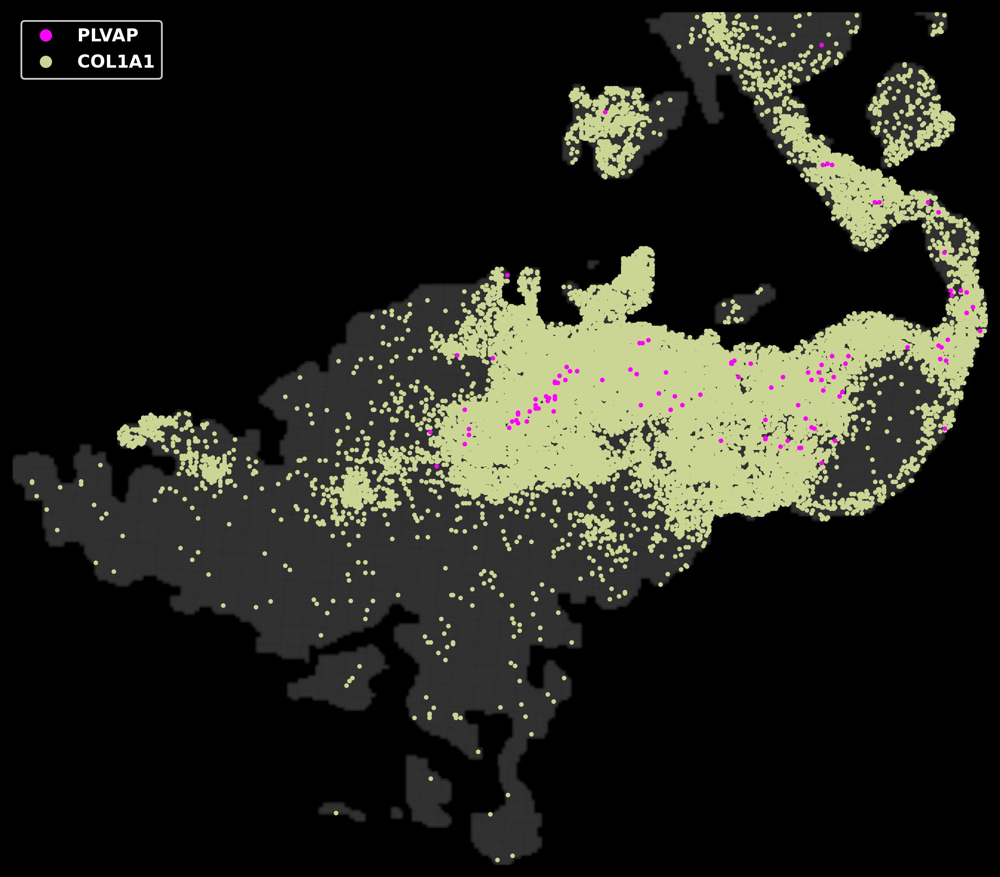

(<Figure size 3000x3000 with 1 Axes>, <Axes: >)

In [48]:
#Plot PLVAP COL1A1
plot_markers(
    CIVA_2um_small,
    ["PLVAP", "COL1A1"],
    thresholds=[0.1, 0.2],
    color_order=["magenta", "#cbd694"],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=7,
)

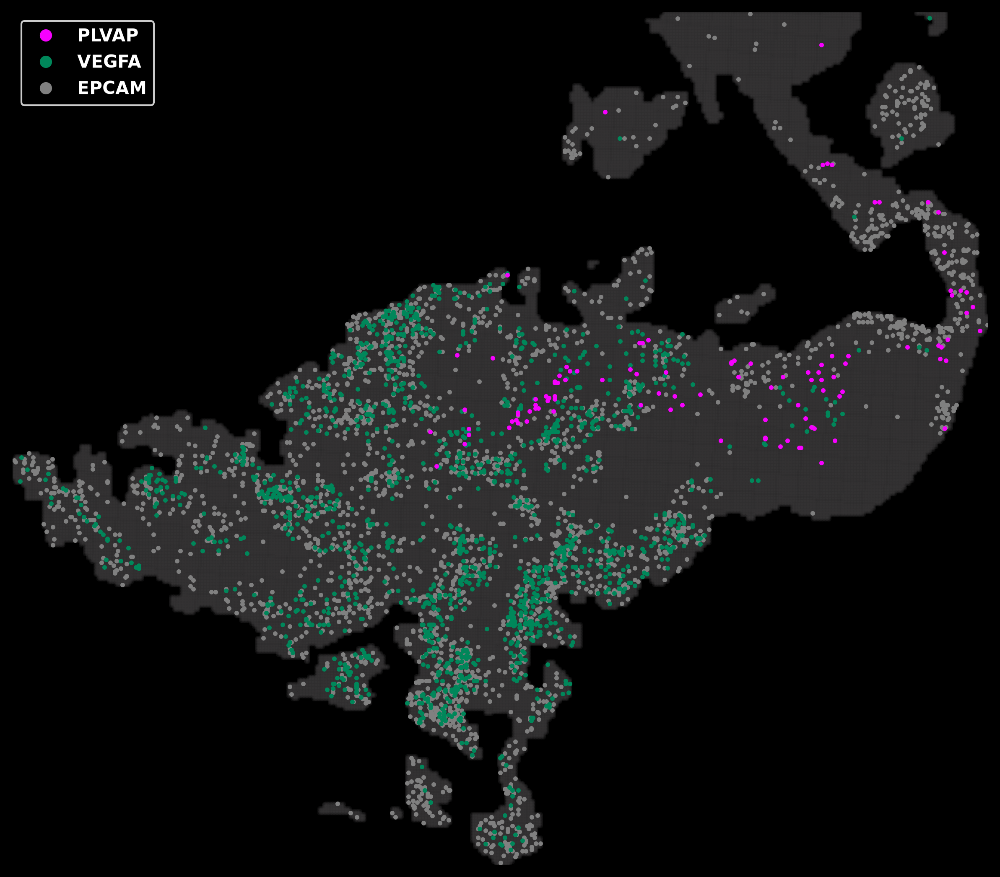

(<Figure size 3000x3000 with 1 Axes>, <Axes: >)

In [49]:
plot_markers(
    CIVA_2um_small,
    ["PLVAP",'VEGFA','EPCAM'],
    thresholds=[0.1,1.2,0.5],
    color_order=["#F700FF",'#00875A','grey'],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=7,
)

Saved: POSTN_LUM_to_PLVAP_distances.csv

Median distances:
POSTN -> PLVAP: 21.63 µm
LUM -> PLVAP: 30.46 µm

Mann–Whitney test:
H1: POSTN -> PLVAP < LUM -> PLVAP
p = 7.994e-20


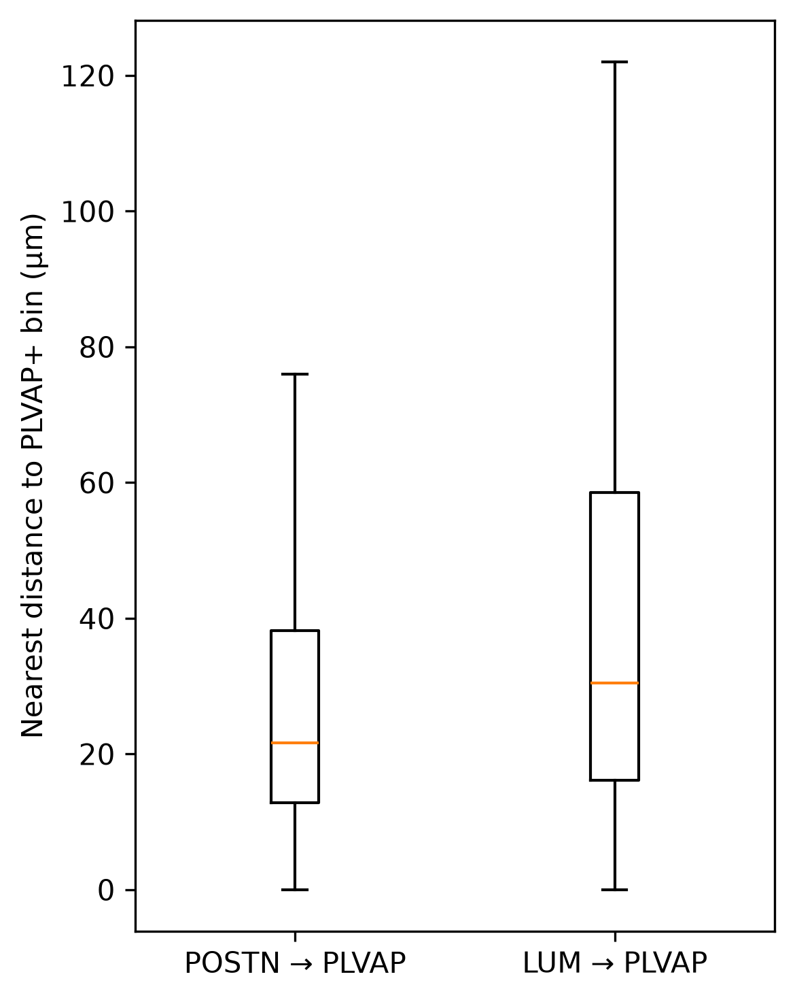

In [50]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt

def compare_to_target(
    adata,
    sources=("POSTN", "LUM"),
    target="PLVAP",
    threshold=0,
    bin_um=2,
    save_name="POSTN_LUM_to_PLVAP_distances.csv"
):
    # Spatial coordinates in µm
    xy = adata.obs[["array_col", "array_row"]].to_numpy(float) * bin_um

    def expr(g):
        pos = np.flatnonzero(adata.var_names == g)
        if len(pos) == 0:
            raise KeyError(f"{g} not found")
        return np.asarray(adata.X[:, pos].sum(axis=1)).ravel()

    # Gene-positive bins
    masks = {
        g: expr(g) > threshold
        for g in list(sources) + [target]
    }

    # PLVAP target coordinates
    target_xy = xy[masks[target]]
    if len(target_xy) == 0:
        raise ValueError(f"No {target}+ bins found")

    tree = cKDTree(target_xy)

    distances = {}

    for g in sources:
        source_xy = xy[masks[g]]

        if len(source_xy) == 0:
            raise ValueError(f"No {g}+ bins found")

        d, _ = tree.query(source_xy, k=1)
        distances[g] = d

    # ============================================================
    # WIDE-FORM CSV
    # Column 1 = POSTN -> PLVAP
    # Column 2 = LUM -> PLVAP
    # ============================================================

    distance_df = pd.DataFrame({
        f"{sources[0]}->{target}": pd.Series(distances[sources[0]]),
        f"{sources[1]}->{target}": pd.Series(distances[sources[1]])
    })

    distance_df.to_csv(save_name, index=False)

    print(f"Saved: {save_name}")
    print("\nMedian distances:")
    print(f"{sources[0]} -> {target}: {np.median(distances[sources[0]]):.2f} µm")
    print(f"{sources[1]} -> {target}: {np.median(distances[sources[1]]):.2f} µm")

    # Statistical test
    test = mannwhitneyu(
        distances[sources[0]],
        distances[sources[1]],
        alternative="less"
    )

    print(
        f"\nMann–Whitney test:"
        f"\nH1: {sources[0]} -> {target} < {sources[1]} -> {target}"
        f"\np = {test.pvalue:.3e}"
    )

    # Plot
    fig, ax = plt.subplots(figsize=(4, 5), dpi=300)

    ax.boxplot(
        [distances[g] for g in sources],
        tick_labels=[f"{g} → {target}" for g in sources],
        showfliers=False
    )

    ax.set_ylabel("Nearest distance to PLVAP+ bin (µm)")
    plt.tight_layout()
    plt.show()

    return distance_df


distance_df = compare_to_target(
    CIVA_2um_small,
    sources=("POSTN", "LUM"),
    target="PLVAP"
)

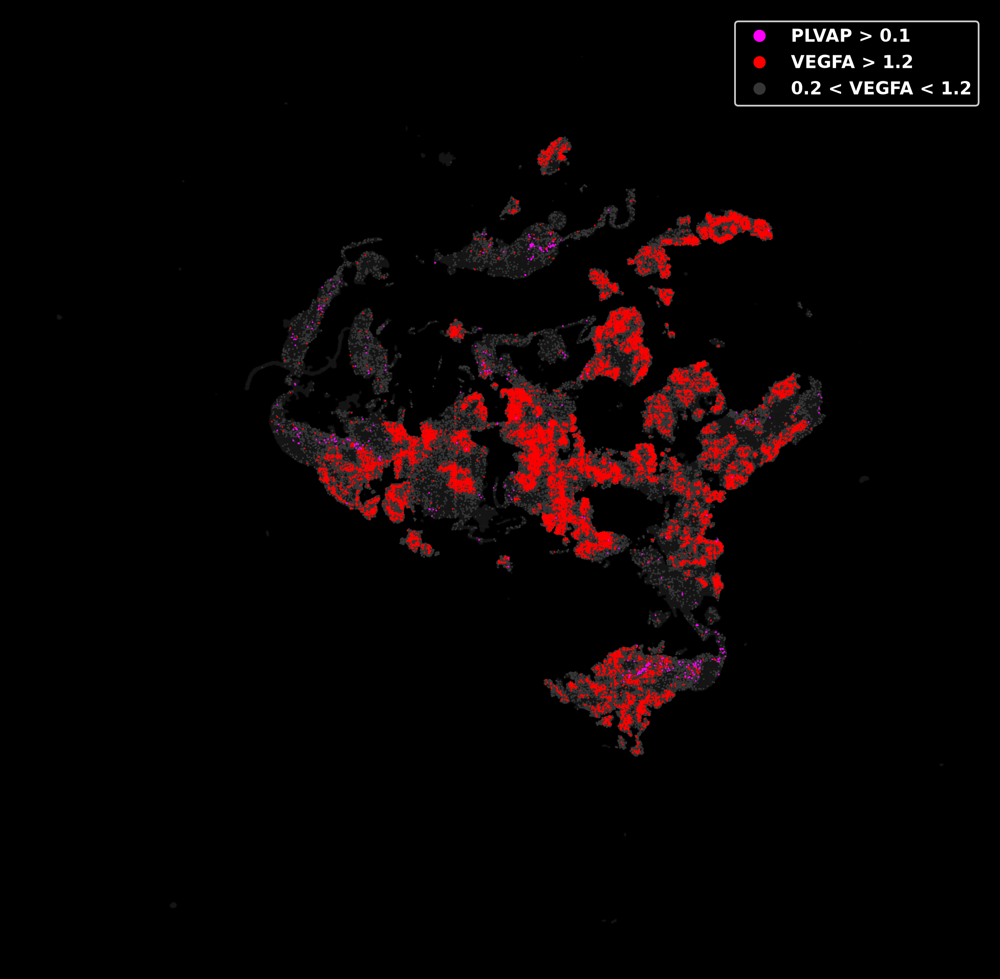

{'PLVAP > 0.1': 333, 'VEGFA > 1.2': 18816, '0.2 < VEGFA < 1.2': 91442, 'tissue': 1019488}


In [51]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def plot_vegfa_plvap_classes(
    adata,
    vegfa_gene="VEGFA",
    plvap_gene="PLVAP",
    vegfa_hi=2,
    vegfa_lo=0.2,
    plvap_thr=0.1,
    color_order=("magenta", "gold", "sage"),   # PLVAP, VEGFA>2, 0.2<VEGFA<2
    tissue_color="tissue",
    tissue_mode="faint",                       # "hide", "faint", "show"
    tissue_alpha=0.03,
    pt_size=1,
    figsize=(10, 10),
    dpi=300,
    background="black",
):
    if tissue_mode not in {"hide", "faint", "show"}:
        raise ValueError("tissue_mode must be 'hide', 'faint', or 'show'.")

    get_color = lambda x: C.get(x, x) if "C" in globals() else x
    colors = {
        "PLVAP": get_color(color_order[0]),
        "VEGFA_high": get_color(color_order[1]),
        "VEGFA_mid": get_color(color_order[2]),
        "tissue": get_color(tissue_color),
    }

    def expr(g):
        pos = np.flatnonzero(adata.var_names == g)
        if len(pos) == 0:
            raise KeyError(f"{g} not found")
        return np.asarray(adata.X[:, pos].sum(axis=1)).ravel()

    vegfa = expr(vegfa_gene)
    plvap = expr(plvap_gene)

    # mutually exclusive labels with priority:
    # 1) PLVAP > threshold
    # 2) VEGFA > vegfa_hi
    # 3) vegfa_lo < VEGFA < vegfa_hi
    labels = np.full(adata.n_obs, "tissue", dtype=object)
    labels[plvap > plvap_thr] = "PLVAP"
    labels[(labels == "tissue") & (vegfa > vegfa_hi)] = "VEGFA_high"
    labels[(labels == "tissue") & (vegfa > vegfa_lo) & (vegfa < vegfa_hi)] = "VEGFA_mid"

    xy = adata.obsm["spatial"]
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi, facecolor=background)
    ax.set_facecolor(background)

    if tissue_mode != "hide":
        m = labels == "tissue"
        ax.scatter(
            xy[m, 0], xy[m, 1],
            s=pt_size,
            c=colors["tissue"],
            alpha=tissue_alpha if tissue_mode == "faint" else 1,
            linewidths=0,
            rasterized=True,
        )

    for key in ["VEGFA_mid", "VEGFA_high", "PLVAP"]:  # draw PLVAP last
        m = labels == key
        ax.scatter(
            xy[m, 0], xy[m, 1],
            s=pt_size,
            c=colors[key],
            alpha=1,
            linewidths=0,
            rasterized=True,
        )

    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.axis("off")

    legend_items = [
        ("PLVAP", f"{plvap_gene} > {plvap_thr}"),
        ("VEGFA_high", f"{vegfa_gene} > {vegfa_hi}"),
        ("VEGFA_mid", f"{vegfa_lo} < {vegfa_gene} < {vegfa_hi}"),
    ]
    handles = [
        Line2D([0], [0], marker="o", linestyle="", markerfacecolor=colors[k],
               markeredgecolor="none", markersize=7, label=lab)
        for k, lab in legend_items
    ]
    leg = ax.legend(handles=handles, frameon=True, facecolor=background, edgecolor="white")
    for t in leg.get_texts():
        t.set_color("white")
        t.set_fontweight("bold")

    plt.show()

    counts = {
        f"{plvap_gene} > {plvap_thr}": int((labels == "PLVAP").sum()),
        f"{vegfa_gene} > {vegfa_hi}": int((labels == "VEGFA_high").sum()),
        f"{vegfa_lo} < {vegfa_gene} < {vegfa_hi}": int((labels == "VEGFA_mid").sum()),
        "tissue": int((labels == "tissue").sum()),
    }
    return fig, ax, counts, labels


# Example
fig, ax, counts, labels = plot_vegfa_plvap_classes(
    CIVA_2um,
    vegfa_gene="VEGFA",
    plvap_gene="PLVAP",
    vegfa_hi=1.2,
    vegfa_lo=0.2,
    plvap_thr=0.1,
    color_order=("magenta", "red", "#363636"),
    tissue_mode="faint",
    pt_size=1,
)
print(counts)

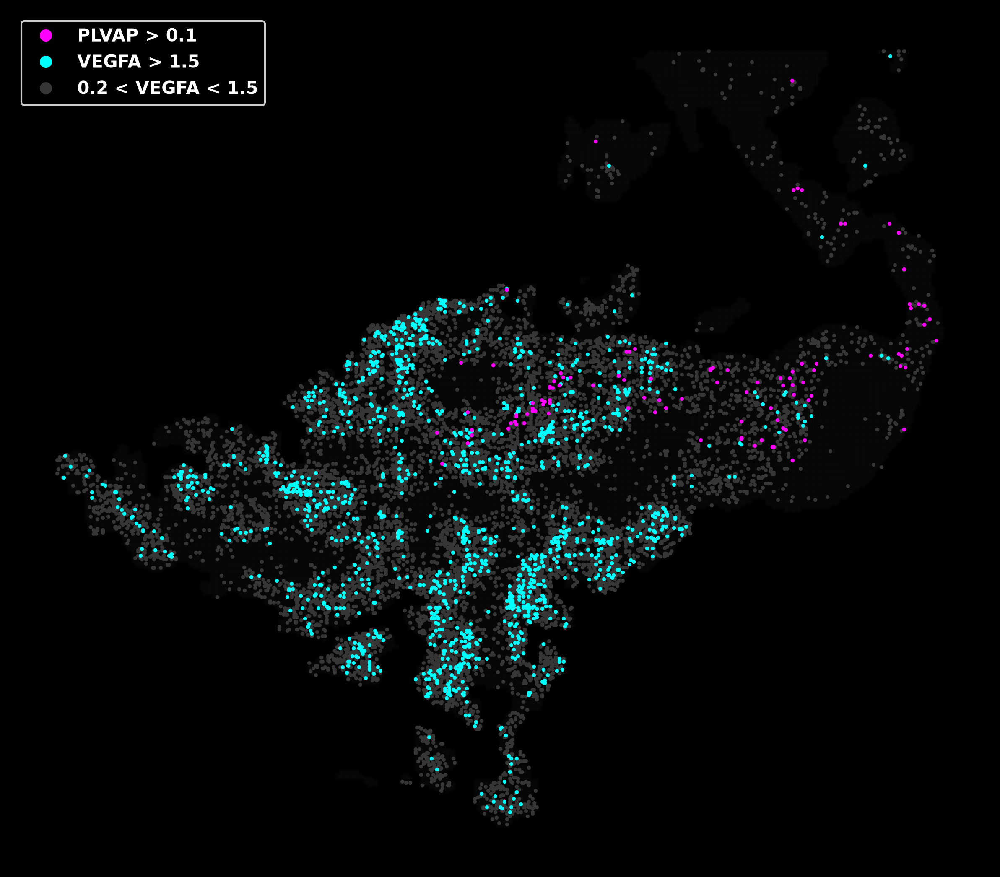

{'PLVAP > 0.1': 105, 'VEGFA > 1.5': 1444, '0.2 < VEGFA < 1.5': 9778, 'tissue': 116169}


In [52]:
# Example
fig, ax, counts, labels = plot_vegfa_plvap_classes(
    CIVA_2um_small,
    vegfa_gene="VEGFA",
    plvap_gene="PLVAP",
    vegfa_hi=1.5,
    vegfa_lo=0.2,
    plvap_thr=0.1,
    color_order=("magenta", "cyan", "#363636"),
    tissue_mode="faint",
    pt_size=5,
)
print(counts)

In [53]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy.stats import spearmanr

GENE_COLORS = {"VEGFA":"green","PLVAP":"magenta","POSTN":"#fcba03","LUM":"#6d9987"}
GENE_LABELS = {
    "VEGFA":"VEGFA+ Tumor",
    "PLVAP":"PLVAP+ EC",
    "POSTN":"POSTN+ Fib",
    "LUM":"POSTN- Fib",
}

def plot_gene_projection(adata, genes=("PLVAP","POSTN"), thresholds=0,
                         axis="y", bin_um=2, smooth_um=20, reverse=False,
                         normalize=True, show_stats=True,
                         figsize=(7,2.3), dpi=300):

    genes = list(genes)
    if len(genes) not in (2,3): raise ValueError("Use 2 or 3 genes.")
    if np.isscalar(thresholds): thresholds = [thresholds]*len(genes)
    if axis not in ("x","y","xy45"): raise ValueError("axis = 'x', 'y', or 'xy45'")

    def expr(g):
        p = np.flatnonzero(adata.var_names == g)
        if not len(p): raise KeyError(f"{g} not found")
        return np.asarray(adata.X[:,p].sum(axis=1)).ravel()

    x = adata.obs["array_col"].to_numpy()
    y = adata.obs["array_row"].to_numpy()

    if axis == "x":
        coord, axis_label = x, "X-axis"
    elif axis == "y":
        coord, axis_label = y, "Y-axis"
    else:
        coord = (x - y) / np.sqrt(2)       # bottom-left → top-right
        axis_label = "45° axis"

    d = {"coord":coord}
    for g,t in zip(genes,thresholds):
        v = expr(g)
        d[g] = np.where(v > t, v, 0)

    df = pd.DataFrame(d).groupby("coord",as_index=False)[genes].sum().sort_values("coord")
    df = df.iloc[::-1].reset_index(drop=True) if reverse else df.reset_index(drop=True)

    start = df.coord.iloc[0]
    df["distance_um"] = abs(df.coord - start) * bin_um

    step_um = np.median(np.diff(np.sort(df.distance_um.unique())))
    w = max(1, round(smooth_um / step_um))

    for g in genes:
        v = df[g].rolling(w,center=True,min_periods=1).mean()
        df[g+"_plot"] = v/v.max() if normalize and v.max()>0 else v

    stats = []
    for g in genes[1:]:
        r,p = spearmanr(df[genes[0]+"_plot"],df[g+"_plot"])
        stats.append(f"{GENE_LABELS[genes[0]]} vs {GENE_LABELS[g]}\nρ = {r:.2f}, P = {p:.2e}")

    fig,ax = plt.subplots(figsize=figsize,dpi=dpi)
    for g in genes:
        ax.plot(df.distance_um,df[g+"_plot"],lw=2,
                color=GENE_COLORS.get(g,"grey"),label=GENE_LABELS.get(g,g))

    ax.set(
        xlabel=f"Distance along {axis_label} (µm)",
        ylabel="Normalized summed expression" if normalize else "Summed expression"
    )
    ax.legend(frameon=False)

    if show_stats:
        ax.text(0.02,0.97,"\n\n".join(stats),transform=ax.transAxes,
                ha="left",va="top",fontsize=11,fontweight="bold")

    ax.spines[["top","right"]].set_visible(False)
    plt.tight_layout()
    plt.show()

    return df

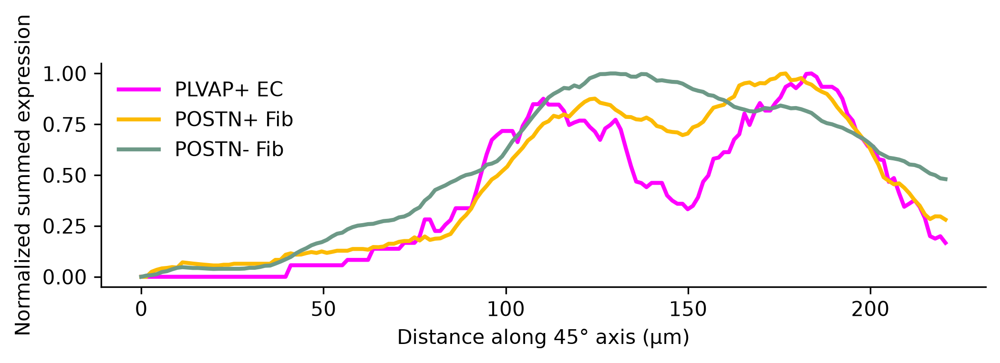

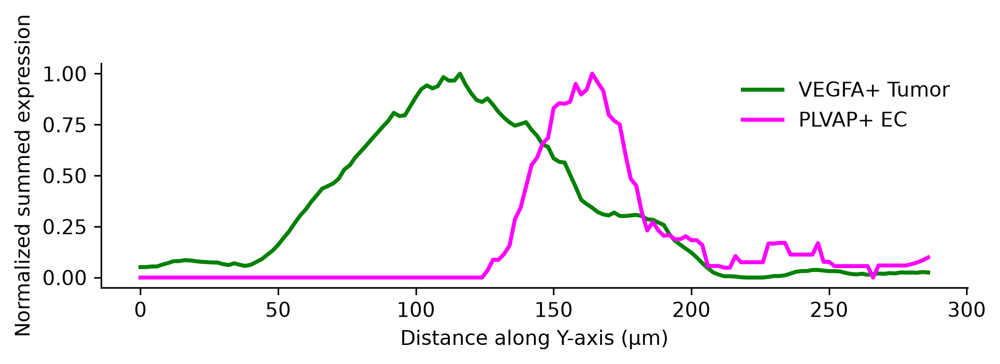

In [54]:
profile = plot_gene_projection(
    CIVA_8um_small,
    genes=("PLVAP","POSTN","LUM"),
    thresholds=(0.1,0.1,0.2),
    axis="xy45",smooth_um=40,
    reverse=True, show_stats=False
)
profile = plot_gene_projection(
    CIVA_8um_small,
    genes=("VEGFA","PLVAP"),
    thresholds=(1.2,0.1),smooth_um=20,
    axis="y",
    reverse=True, show_stats=False
)

In [55]:
'''# Save
CIVA_8um_small.write_h5ad("CIVA_8um_small.h5ad")

# Load
import scanpy as sc
CIVA_8um_small = sc.read_h5ad("CIVA_8um_small.h5ad")'''

'# Save\nCIVA_8um_small.write_h5ad("CIVA_8um_small.h5ad")\n\n# Load\nimport scanpy as sc\nCIVA_8um_small = sc.read_h5ad("CIVA_8um_small.h5ad")'

In [56]:
# Save
CIVA_8um_roi.write_h5ad("CIVA_8um_roi.h5ad")

# Load
import scanpy as sc
CIVA_8um_roi = sc.read_h5ad("CIVA_8um_roi.h5ad")

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def subset_roi(
    adata,
    xmin, xmax,
    ymin, ymax,
    groupby="cell_type",
    bin_um=8,
    scale_um=200,
    pt_size=3,
    figsize=(8, 8),
    colors=None,
    background="white",
):
    xy = adata.obsm["spatial"]

    # ---------------- ROI ----------------
    mask = (
        (xy[:, 0] >= xmin) & (xy[:, 0] <= xmax) &
        (xy[:, 1] >= ymin) & (xy[:, 1] <= ymax)
    )
    roi = adata[mask].copy()

    if roi.n_obs == 0:
        raise ValueError("No bins found. Check xmin/xmax/ymin/ymax.")

    # ---------------- colors ----------------
    s = roi.obs[groupby]

    if colors is None:
        key = f"{groupby}_colors"

        if key in adata.uns and hasattr(adata.obs[groupby].dtype, "categories"):
            cats_all = list(adata.obs[groupby].cat.categories)
            colors = dict(zip(cats_all, adata.uns[key]))
        else:
            cats_all = list(pd.unique(adata.obs[groupby]))
            cmap = plt.get_cmap("tab20")
            colors = {c: cmap(i % 20) for i, c in enumerate(cats_all)}

    # ---------------- plot ----------------
    fig, ax = plt.subplots(figsize=figsize, dpi=200)
    ax.set_facecolor(background)

    xy_roi = roi.obsm["spatial"]

    for ct in pd.unique(s):
        m = (s == ct).to_numpy()
        ax.scatter(
            xy_roi[m, 0], xy_roi[m, 1],
            s=pt_size,
            color=colors.get(ct, "grey"),
            label=ct,
            linewidths=0
        )

    # Preserve exact ROI extent
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymax, ymin)
    ax.set_aspect("equal")

    ax.set_xlabel("Spatial x")
    ax.set_ylabel("Spatial y")
    ax.set_title(f"ROI — {roi.n_obs:,} bins")

    # ---------------- µm scale bar ----------------
    # Infer spatial pixels/bin from array_col,array_row → spatial coordinates
    if {"array_col", "array_row"}.issubset(adata.obs.columns):
        A = np.c_[
            adata.obs["array_col"].to_numpy(),
            adata.obs["array_row"].to_numpy(),
            np.ones(adata.n_obs)
        ]

        coef, *_ = np.linalg.lstsq(A, xy, rcond=None)

        col_step = np.linalg.norm(coef[0])
        row_step = np.linalg.norm(coef[1])
        units_per_bin = (col_step + row_step) / 2

        bar = units_per_bin * scale_um / bin_um

        x0 = xmin + 0.06 * (xmax - xmin)
        y0 = ymax - 0.08 * (ymax - ymin)

        ax.plot(
            [x0, x0 + bar], [y0, y0],
            color="black" if background == "white" else "white",
            lw=4,
            solid_capstyle="butt"
        )
        ax.text(
            x0 + bar / 2,
            y0 - 0.025 * (ymax - ymin),
            f"{scale_um} µm",
            ha="center",
            va="top",
            color="black" if background == "white" else "white"
        )

    ax.legend(
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        frameon=False,
        markerscale=2
    )

    plt.tight_layout()
    plt.show()

    print(f"ROI bins: {roi.n_obs:,}")
    print(f"x = {xmin}–{xmax}")
    print(f"y = {ymin}–{ymax}")

    return roi

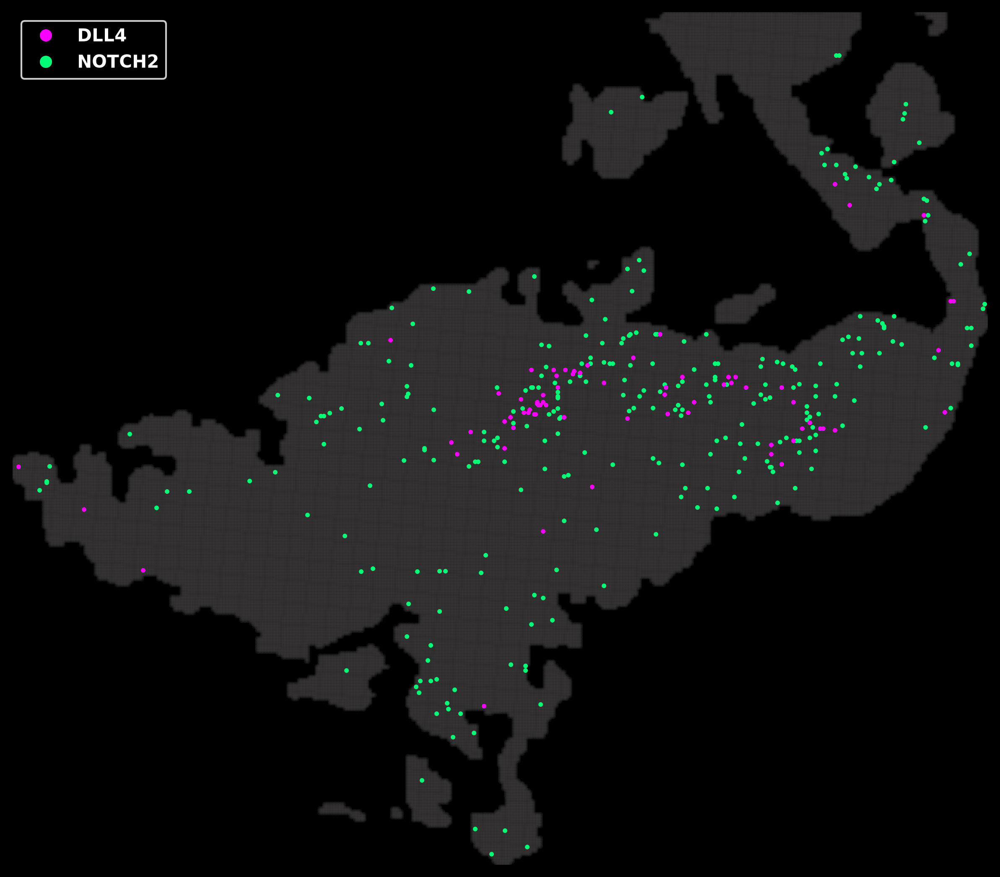

(<Figure size 3000x3000 with 1 Axes>, <Axes: >)

In [58]:
plot_markers(
    CIVA_2um_small,
    ["DLL4", "NOTCH2"],
    thresholds=[0.1, 0.7],
    color_order=["#F700FF", "#00FF77"],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=7,
)

In [59]:
CIVA_8um_small

AnnData object with n_obs × n_vars = 7162 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'library_id', 'total_counts', 'n_genes_by_counts', 'label2', 'label3', 'cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'cnv', 'deg_layer3', 'deg_layer4', 'dendrogram_layer3', 'dendrogram_layer4', 'dendrogram_leiden_1.4', 'hvg', 'label1_colors', 'label_CD44_colors', 'label_EPCAMCD44_colors', 'label_SPP1_colors', 'layer3_colors', 'layer4_colors', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_0.8', 'leiden_1', 'leiden_1.2', 'leiden_1.2_colors', 'leiden_1.4', 'leiden_1.4_colors', 'leiden_1_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_cnv', 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'connectivities', 'distances'

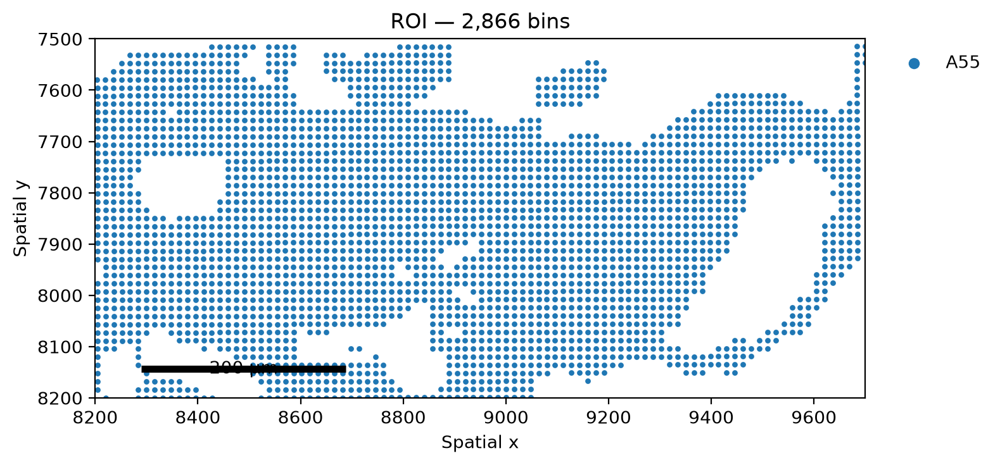

ROI bins: 2,866
x = 8200–9700
y = 7500–8200


In [60]:
CIVA_8um_LR = subset_roi(
    CIVA_8um_small,
    xmin=8200,
    xmax=9700,
    ymin=7500,
    ymax=8200,
    groupby="library_id",
    scale_um=200,
    pt_size=10
)

In [61]:
plot_markers(
    CIVA_2um_LR,
    ["PLVAP", "CD163", "C1QC"],
    thresholds=[0.1,0.1, 0.1],
    color_order=["#F700FF", "#00FF77",'blue'],
    tissue_mode="faint",
    tissue_alpha=0.2,
    pt_size=5,
)

NameError: name 'CIVA_2um_LR' is not defined

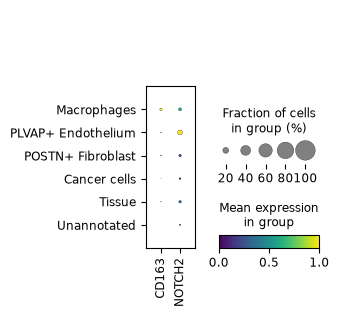

In [ ]:
sc.pl.dotplot(
    CIVA_8um_LR,
    var_names=["CD163", "NOTCH2"],
    groupby="cell_type",
    gene_symbols="gene_name",
    standard_scale="var",
    dot_max=1,
    cmap="viridis",
)

In [ ]:
# Save
CIVA_8um_LR.write_h5ad("01_MS/CIVA_8um_LR.h5ad")

# Load
import scanpy as sc
CIVA_8um_LR = sc.read_h5ad("01_MS/CIVA_8um_LR.h5ad")

PLVAP → VEGFA: median 2.83 µm
PLVAP → EPCAM: median 14.14 µm
Paired Wilcoxon p = 1.897e-15


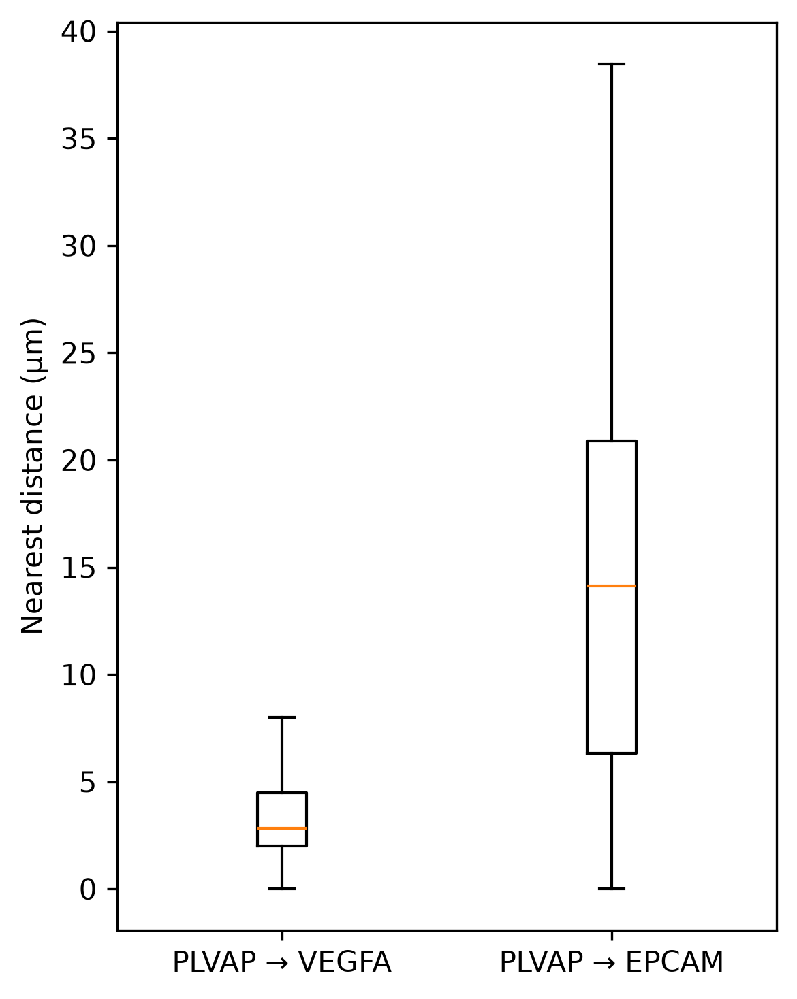

In [ ]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.stats import wilcoxon

def compare_from_source(adata, source="PLVAP", targets=("POSTN","EPCAM"),
                        thresholds=None, bin_um=2, save_name="distances.csv"):
    thresholds = thresholds or {}
    xy = adata.obs[["array_col","array_row"]].to_numpy(float) * bin_um

    def expr(g):
        i = np.flatnonzero(adata.var_names == g)
        if not len(i): raise KeyError(f"{g} not found")
        return np.asarray(adata.X[:, i].sum(axis=1)).ravel()

    masks = {g: expr(g) > thresholds.get(g, 0) for g in (source, *targets)}
    src = xy[masks[source]]
    d = {g: cKDTree(xy[masks[g]]).query(src)[0] for g in targets}

    df = pd.DataFrame({f"{source}->{g}": d[g] for g in targets})
    df.to_csv(save_name, index=False)

    for g in targets:
        print(f"{source} → {g}: median {np.median(d[g]):.2f} µm")

    if len(targets) == 2:
        p = wilcoxon(d[targets[0]], d[targets[1]], alternative="less").pvalue
        print(f"Paired Wilcoxon p = {p:.3e}")

    plt.figure(figsize=(4,5), dpi=300)
    plt.boxplot([d[g] for g in targets],
                tick_labels=[f"{source} → {g}" for g in targets],
                showfliers=False)
    plt.ylabel("Nearest distance (µm)")
    plt.tight_layout()
    plt.show()
    return df

distance_df = compare_from_source(
    CIVA_2um_small,
    source="PLVAP",
    targets=("VEGFA","EPCAM"),
    thresholds={"PLVAP":0.1, "VEGFA":0.1, "EPCAM":0.1},save_name='Distance_PLVAP_Tumor.csv'
)